Load libraries

In [1]:
from ma_mapper import mapper
from ma_mapper import plots
from ma_mapper import custom_cmap

### Initial Parameters

In [2]:
alignment_filepath = '/rds/project/rds-XrHDlpCeVDg/users/pakkanan/data/output/ma_mapper/hg38_main/alignment/THE1C.fasta.aligned'
AP1_motif_data_filepath = '/rds/project/rds-XrHDlpCeVDg/users/pakkanan/data/resource/annotation/homer_known_motif_hg38/AP-1(bZIP).bed'
NFkB_motif_data_filepath = '/rds/project/rds-XrHDlpCeVDg/users/pakkanan/data/resource/annotation/homer_known_motif_hg38/NFkB-p65(RHD).bed'
phyloP_data_filepath = '/rds/project/rds-XrHDlpCeVDg/users/pakkanan/data/resource/UCSC_phyloP_track/hg38.phyloP447way.bw'

Extract genomewide data into data matrix using coordinates and alignment structure from the alignment file 

In [3]:
ap1_matrix=mapper.map_and_overlay(alignment_filepath, AP1_motif_data_filepath,data_format='bed')
nfkb_matrix=mapper.map_and_overlay(alignment_filepath, NFkB_motif_data_filepath,data_format='bed')

2025-03-19 06:48:34,974 INFO: parse alignment
2025-03-19 06:48:41,666 INFO: extract from bed file: /rds/project/rds-XrHDlpCeVDg/users/pakkanan/data/resource/annotation/homer_known_motif_hg38/AP-1(bZIP).bed
2025-03-19 06:49:14,391 INFO: done, returning bed_out as object
2025-03-19 06:49:14,646 INFO: {<class 'numpy.float64'>}
2025-03-19 06:49:14,646 INFO: nested_data:False
2025-03-19 06:49:15,120 INFO: parse alignment
2025-03-19 06:49:20,846 INFO: extract from bed file: /rds/project/rds-XrHDlpCeVDg/users/pakkanan/data/resource/annotation/homer_known_motif_hg38/NFkB-p65(RHD).bed
2025-03-19 06:49:54,572 INFO: done, returning bed_out as object
2025-03-19 06:49:54,828 INFO: {<class 'numpy.float64'>}
2025-03-19 06:49:54,828 INFO: nested_data:False


In [4]:
ap1_matrix

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [5]:
nfkb_matrix

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

# DATA OVERLAY
Since different kinds of data are overlaid on the same TE alignment, it is possible to overlay their plot to gain visual insight about the data 

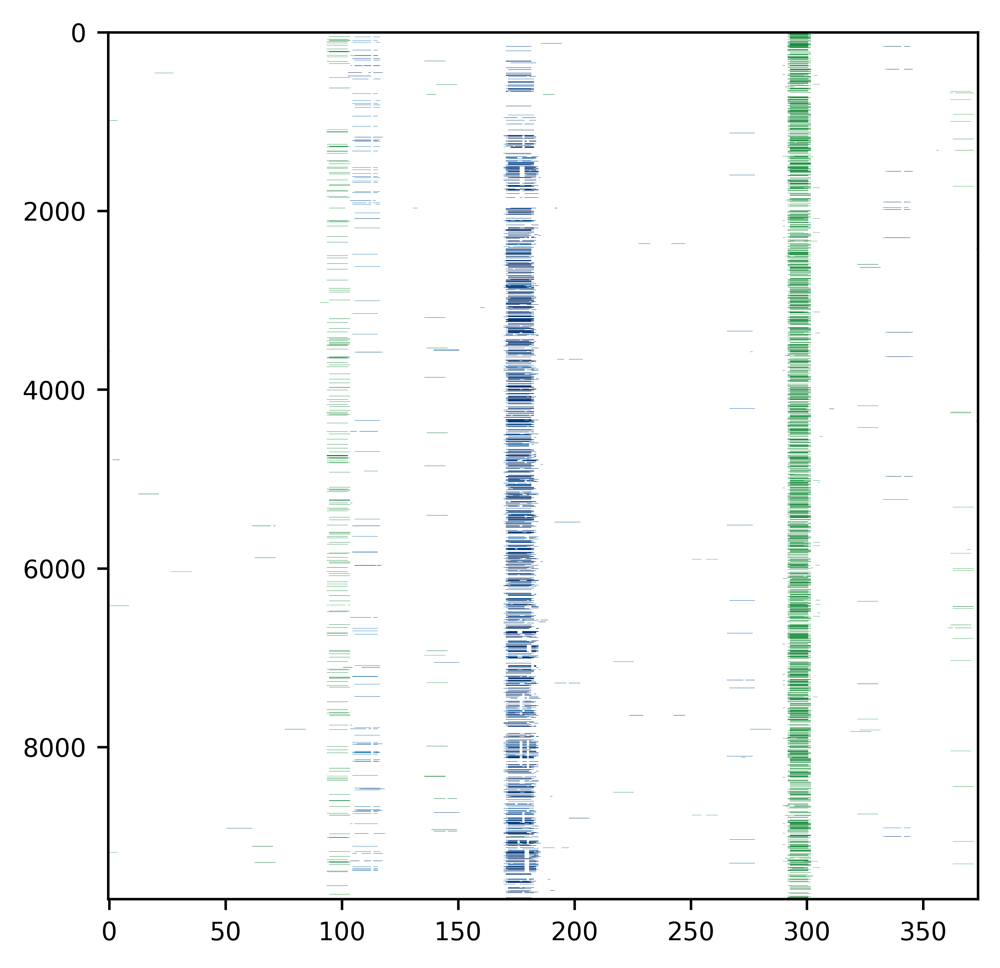

In [6]:
plots.plot(data=[nfkb_matrix,ap1_matrix], heatmap_color=["Blues","Greens"], vlim =[[0,10],[0,10]], opacity=0.99)

# PLOT SORTING
Genomewide data can be used to sort data matrix

calculate AP-1 coverage

In [7]:
alignment_matrix, coordinate_table=mapper.parse_and_filter(alignment_filepath)
ap1_coverage_array=mapper.normalise(alignment_matrix=alignment_matrix, data_matrix=ap1_matrix, method='perc_coverage')

2025-03-19 06:53:05,526 INFO: parse alignment


In [8]:
alignment_matrix

array([[3., 4., 1., ..., 1., 2., 1.],
       [3., 4., 1., ..., 1., 2., 1.],
       [3., 4., 1., ..., 1., 2., 1.],
       ...,
       [3., 4., 1., ..., 0., 0., 0.],
       [0., 0., 1., ..., 1., 2., 1.],
       [3., 4., 2., ..., 1., 0., 0.]])

In [9]:
coordinate_table

,chrom,start,end,name,score,strand,original_order
0,chr1,119563,119944,THE1C_0,20,-,0
1,chr1,296133,296514,THE1C_1,20,-,1
2,chr1,710552,710933,THE1C_2,20,-,2
3,chr19,181416,181797,THE1C_3502,20,-,3
4,chr9,138295330,138295711,THE1C_9041,20,+,4
...,...,...,...,...,...,...,...
9775,chr16,63291039,63291257,THE1C_2951,20,+,9775
9776,chrY,16695786,16696114,THE1C_9770,20,+,9776
9778,chr2,190537612,190537920,THE1C_4233,20,+,9778
9782,chr1,104208527,104208749,THE1C_335,20,-,9782


In [10]:
ap1_coverage_array

array([1.69006760e-01, 1.38034885e-01, 1.30532811e-01, 1.29214143e-01,
       9.32618326e-02, 6.95652174e-02, 6.94685655e-02, 6.91642651e-02,
       6.91642651e-02, 5.74712644e-02, 6.92281066e-02, 6.91722389e-02,
       6.99219205e-02, 8.54805227e-02, 4.69208211e-02, 4.62000462e-02,
       6.88942473e-02, 5.75638959e-02, 5.76834333e-02, 5.75771534e-02,
       8.01465537e-02, 8.02200321e-02, 4.57823051e-02, 4.58190149e-02,
       3.44946533e-02, 2.29095074e-02, 3.41919307e-02, 6.82128240e-02,
       7.95635372e-02, 6.81740711e-02, 6.82205799e-02, 6.83293475e-02,
       6.82128240e-02, 6.83060109e-02, 6.83526999e-02, 5.70841420e-02,
       2.28545309e-02, 1.15048320e-02, 3.45423143e-02, 3.46540372e-02,
       3.48513011e-02, 2.32612235e-02, 3.47866419e-02, 3.47141865e-02,
       5.86510264e-02, 5.98730691e-02, 6.03864734e-02, 2.56213169e-02,
       3.88450084e-02, 1.32397723e-02, 2.64935753e-02, 1.31061599e-02,
       1.30446126e-02, 1.22354093e-02, 1.19517151e-02, 1.17882824e-02,
      

Since the coordinate table was filtered in parse and filter function, reset index to match positions in output matrices

In [11]:
coordinate_table = coordinate_table.reset_index()

In [12]:
coordinate_table

,index,chrom,start,end,name,score,strand,original_order
0,0,chr1,119563,119944,THE1C_0,20,-,0
1,1,chr1,296133,296514,THE1C_1,20,-,1
2,2,chr1,710552,710933,THE1C_2,20,-,2
3,3,chr19,181416,181797,THE1C_3502,20,-,3
4,4,chr9,138295330,138295711,THE1C_9041,20,+,4
...,...,...,...,...,...,...,...,...
9694,9775,chr16,63291039,63291257,THE1C_2951,20,+,9775
9695,9776,chrY,16695786,16696114,THE1C_9770,20,+,9776
9696,9778,chr2,190537612,190537920,THE1C_4233,20,+,9778
9697,9782,chr1,104208527,104208749,THE1C_335,20,-,9782


Find peaks of coverage

In [14]:
import scipy
peaks, _ = scipy.signal.find_peaks(ap1_coverage_array, width = 6)

In [17]:
peaks

array([ 28,  70,  76,  97, 113, 138, 180, 188, 225, 294, 326, 370])

In [15]:
import numpy as np
index_of_rows_with_ap1 = np.unique(np.where(ap1_matrix[:, peaks] != 0)[0])
index_of_rows_without_ap1=list(set(np.arange(ap1_matrix.shape[0])) - set(index_of_rows_with_ap1))
index_sorted=np.concatenate((index_of_rows_with_ap1, index_of_rows_without_ap1))

In [18]:
index_of_rows_with_ap1

array([  16,   18,   19, ..., 9680, 9684, 9685])

In [19]:
index_of_rows_without_ap1

[0,
 1,
 2,
 3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 8201,
 17,
 8202,
 8212,
 8214,
 8219,
 30,
 8223,
 33,
 34,
 8225,
 8226,
 37,
 38,
 39,
 8227,
 8228,
 42,
 8231,
 8233,
 8234,
 47,
 50,
 51,
 8243,
 8244,
 8246,
 8247,
 57,
 8249,
 59,
 8251,
 8252,
 8254,
 8256,
 8259,
 68,
 8260,
 8261,
 71,
 73,
 74,
 75,
 8268,
 78,
 79,
 80,
 81,
 8270,
 83,
 84,
 8278,
 87,
 90,
 98,
 8292,
 8293,
 8294,
 8295,
 8296,
 110,
 8303,
 113,
 8306,
 115,
 8307,
 117,
 8309,
 120,
 125,
 127,
 8319,
 8320,
 8321,
 133,
 8325,
 135,
 8327,
 8330,
 139,
 8331,
 142,
 8334,
 8335,
 8337,
 146,
 8338,
 8339,
 8340,
 8342,
 8343,
 154,
 155,
 8349,
 158,
 8350,
 8352,
 8353,
 8355,
 8356,
 168,
 8360,
 8361,
 8362,
 8363,
 8364,
 8366,
 8368,
 8369,
 178,
 8370,
 181,
 182,
 8373,
 185,
 8377,
 8380,
 190,
 8382,
 8383,
 8384,
 194,
 8385,
 8386,
 198,
 8392,
 8393,
 203,
 204,
 8399,
 208,
 209,
 210,
 8403,
 214,
 215,
 8406,
 217,
 218,
 219,
 8411,
 8412,
 8414,
 223,
 224,
 841

In [20]:
index_sorted

array([  16,   18,   19, ..., 8188, 8189, 8191])

The sorted index can be used to rearrange matrix of mapped genomewide data

In [16]:
ap1_matrix_sorted = ap1_matrix[index_sorted]
nfkb_matrix_sorted = nfkb_matrix[index_sorted]

In [21]:
ap1_matrix_sorted

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [22]:
nfkb_matrix_sorted

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

Visualize

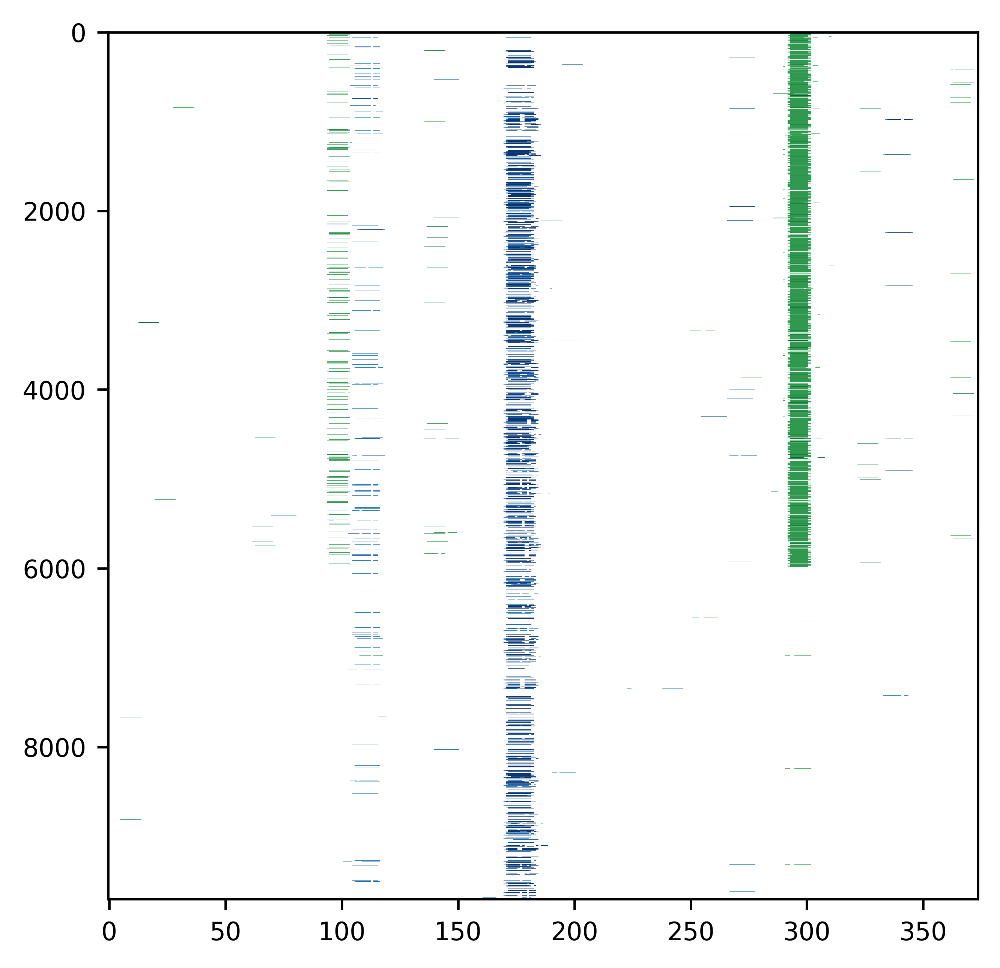

In [23]:
plots.plot(data=[nfkb_matrix_sorted,ap1_matrix_sorted], heatmap_color=["Blues","Greens"], vlim =[[0,10],[0,10]], opacity=0.99)

# PLOT ANNOTATION
Some data such as phyloP can use visual aid from TF motif annotation

In [24]:
phyloP_matrix = mapper.map_and_overlay(alignment_filepath, phyloP_data_filepath, data_format='bigwig')

2025-03-19 06:57:49,497 INFO: parse alignment
2025-03-19 06:57:58,008 INFO: done, returning bigwig_out as object
2025-03-19 06:57:58,264 INFO: {<class 'numpy.float32'>}
2025-03-19 06:57:58,264 INFO: nested_data:False


In [25]:
phyloP_matrix

array([[-0.41499999,  0.88099998,  0.81400001, ..., -0.954     ,
        -0.33700001,  0.815     ],
       [-0.41499999,  0.88099998,  0.81400001, ..., -0.954     ,
        -0.33700001,  0.815     ],
       [-0.41499999,  0.88099998,  0.81400001, ..., -0.954     ,
        -0.33700001,  0.815     ],
       ...,
       [ 0.003     , -0.34999999,  0.80900002, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        ,  0.        ,  0.76099998, ...,  0.81699997,
         0.048     ,  0.81699997],
       [ 0.38      ,  0.40799999,  0.40799999, ...,  0.2       ,
         0.        ,  0.        ]])

The data matrix extracted from genome-wide data of TE can also be annotated using coordinate table as a metadata table.

In [26]:
coordinate_table['AP1_motif'] = 1
coordinate_table.loc[coordinate_table.index.isin(index_of_rows_with_ap1), 'AP1_motif'] = 0

In [27]:
coordinate_table

,index,chrom,start,end,name,score,strand,original_order,AP1_motif
0,0,chr1,119563,119944,THE1C_0,20,-,0,1
1,1,chr1,296133,296514,THE1C_1,20,-,1,1
2,2,chr1,710552,710933,THE1C_2,20,-,2,1
3,3,chr19,181416,181797,THE1C_3502,20,-,3,1
4,4,chr9,138295330,138295711,THE1C_9041,20,+,4,1
...,...,...,...,...,...,...,...,...,...
9694,9775,chr16,63291039,63291257,THE1C_2951,20,+,9775,1
9695,9776,chrY,16695786,16696114,THE1C_9770,20,+,9776,1
9696,9778,chr2,190537612,190537920,THE1C_4233,20,+,9778,1
9697,9782,chr1,104208527,104208749,THE1C_335,20,-,9782,1


Extract annotation from metadata

In [29]:
ap1_motif_annotation=coordinate_table['AP1_motif']

In [30]:
ap1_motif_annotation

0       1
1       1
2       1
3       1
4       1
       ..
9694    1
9695    1
9696    1
9697    1
9698    1
Name: AP1_motif, Length: 9699, dtype: int64

Visualize

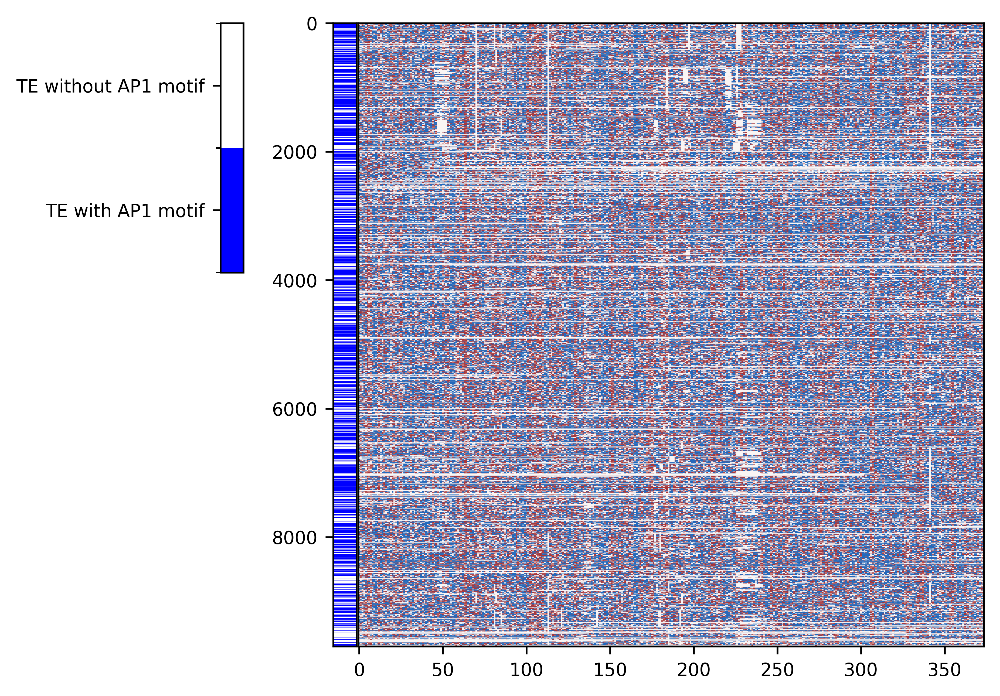

In [31]:
plots.plot(data=[phyloP_matrix], heatmap_color=[custom_cmap.vlag_r_mpl], vlim =[[-0.5,0.5]], opacity=0.99, annotation = True, anno_col=[['blue','white']], annotation_data= [ap1_motif_annotation], anno_cbar_label=[['TE with AP1 motif', 'TE without AP1 motif']])

# ANNOTATION SORTING
The sorted index can be used with annotation.

Sort the matrix

In [33]:
phyloP_matrix_sorted = phyloP_matrix[index_sorted]

In [34]:
phyloP_matrix_sorted

array([[ 4.58999991e-01,  4.93000001e-01,  4.58999991e-01, ...,
         4.30000007e-01, -2.50000004e-02,  1.57000005e-01],
       [ 0.00000000e+00,  0.00000000e+00, -4.44000006e-01, ...,
        -4.53000009e-01, -2.37400007e+00,  7.82000005e-01],
       [-6.70000017e-02,  7.73000002e-01, -5.49000025e-01, ...,
        -1.09099996e+00, -4.65999991e-01,  7.17000008e-01],
       ...,
       [ 8.16999972e-01,  8.16999972e-01,  7.00000022e-03, ...,
         0.00000000e+00,  0.00000000e+00,  0.00000000e+00],
       [-9.85000014e-01,  3.90000008e-02, -0.00000000e+00, ...,
        -3.38000000e-01, -6.69000030e-01, -5.72000027e-01],
       [-1.00000005e-03,  4.95999992e-01, -4.23000008e-01, ...,
        -9.76000011e-01,  0.00000000e+00,  0.00000000e+00]])

Comparison

Before sorting:

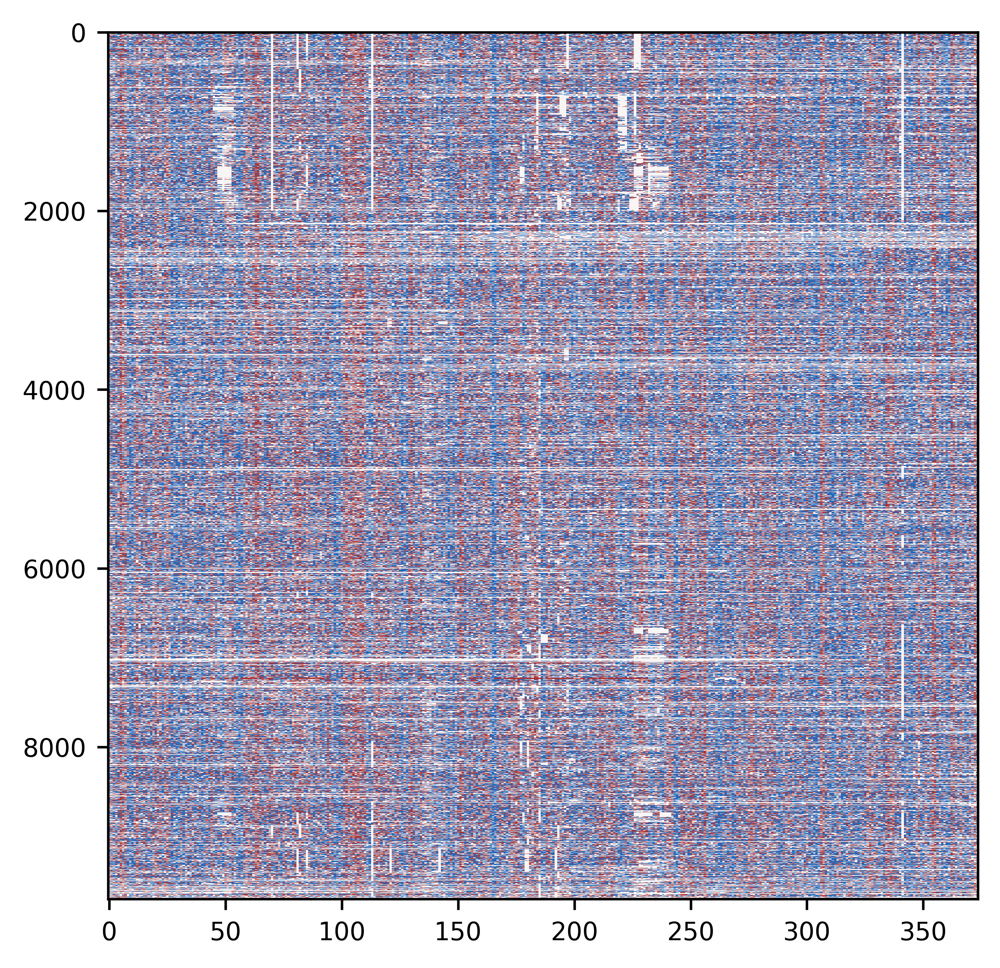

In [35]:
plots.plot(data=[phyloP_matrix], heatmap_color=[custom_cmap.vlag_r_mpl], vlim =[[-0.5,0.5]], opacity=0.99)


After sorting:

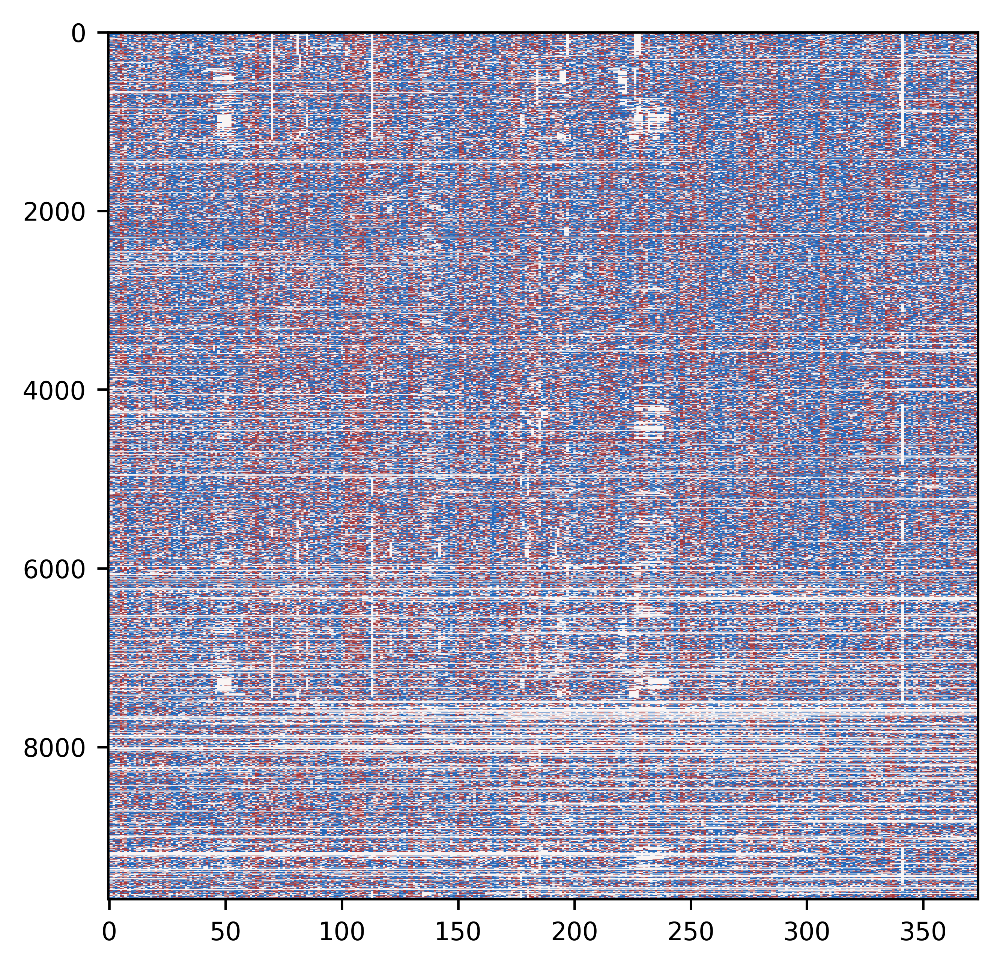

In [36]:
plots.plot(data=[phyloP_matrix_sorted], heatmap_color=[custom_cmap.vlag_r_mpl], vlim =[[-0.5,0.5]], opacity=0.99)

Sort rows in metadata using row order from coverage sort earlier

In [37]:
coordinate_table_sorted=coordinate_table.iloc[index_sorted]

In [38]:
coordinate_table_sorted

,index,chrom,start,end,name,score,strand,original_order,AP1_motif
16,16,chr14,20358384,20358753,THE1C_2256,20,+,16,0
18,18,chr5,15154685,15155058,THE1C_6335,20,-,18,0
19,19,chrX,144829177,144829565,THE1C_9632,20,+,19,0
20,20,chr6,115335134,115335507,THE1C_7372,20,+,20,0
21,21,chr3,108734804,108735161,THE1C_5199,20,-,21,0
...,...,...,...,...,...,...,...,...,...
8185,8231,chr12,42456406,42456755,THE1C_1494,20,+,8231,1
8186,8232,chr7,156896869,156896935,THE1C_8156,20,-,8232,1
8188,8234,chr11,38118506,38118663,THE1C_1151,20,-,8234,1
8189,8235,chr6,65719092,65719465,THE1C_7134,20,+,8235,1


Now the metadata table has the same order as the sorted alignment, extract annotation

In [39]:
ap1_motif_annotation_sorted=coordinate_table_sorted['AP1_motif']

In [40]:
ap1_motif_annotation_sorted

16      0
18      0
19      0
20      0
21      0
       ..
8185    1
8186    1
8188    1
8189    1
8191    1
Name: AP1_motif, Length: 9699, dtype: int64

Visualize

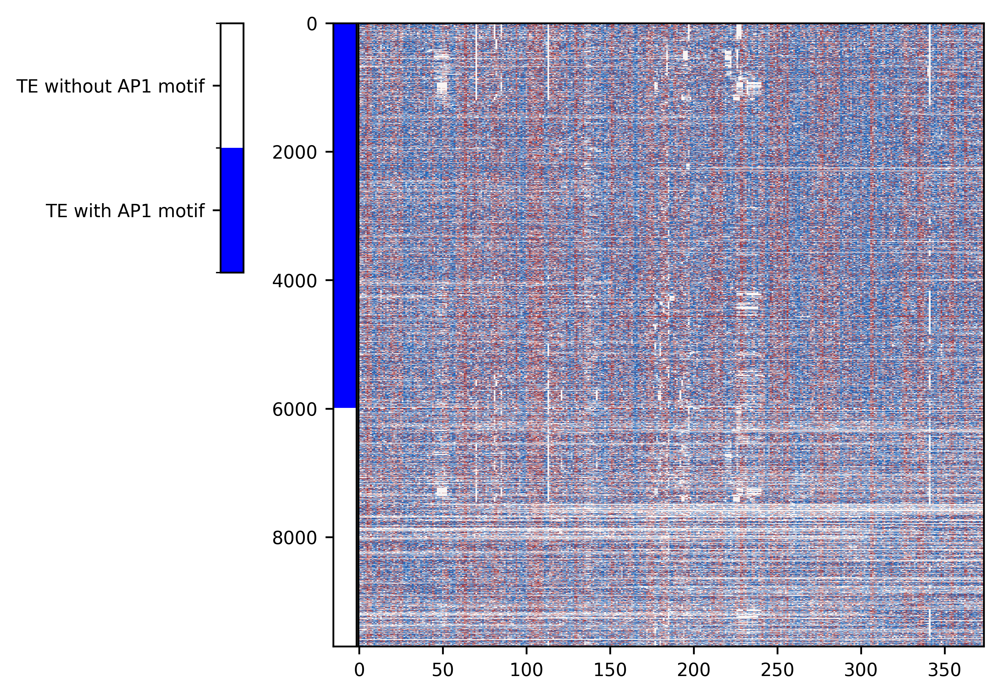

In [41]:
plots.plot(data=[phyloP_matrix_sorted], heatmap_color=[custom_cmap.vlag_r_mpl], vlim =[[-0.5,0.5]], opacity=0.99, annotation = True, anno_col=[['blue','white']], annotation_data= [ap1_motif_annotation_sorted], anno_cbar_label=[['TE with AP1 motif', 'TE without AP1 motif']])